In [4]:
#Importamos las librerias necesarias
import os
import numpy as np
import pandas as pd
import json

import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.colors import ListedColormap

import rasterio as rio
import rasterio.warp as warp
from rasterio.enums import Resampling
from rasterio.plot import show

from PIL import ImageColor

import keras
from keras.layers import Conv2D, Conv2DTranspose, Dropout, MaxPooling2D, Input, concatenate
from keras.models import Model
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
from skimage.exposure import rescale_intensity


In [17]:
#Localización del data: JSON de clases con paleta de colores, imagen original y su máscara.
colores_dir = r'C:\Users\Usuari\Documents\TFM_Codigos\MODELO\data/7Labels.json'
imagen_dir = r'C:\Users\Usuari\Documents\TFM_Codigos\DATASET\IMAGENES\041.JPG'
mascara_dir = r'C:\Users\Usuari\Documents\TFM_Codigos\DATASET\MASCARAS\041.tif'

In [14]:
# Load Land Cover Parameter
colores = json.load(open(colores_dir))
colores_df = pd.DataFrame(colores)
colores_df["values_normalize"] = colores_df.index
colores_df["palette"] = "#" + colores_df["palette"]

# Mapping from old to new values
values = colores_df["values"].to_list()
values_norm = colores_df["values_normalize"].to_list()
palette = colores_df["palette"].to_list()
labels = colores_df["label"].to_list()
dict_values = {}
dict_label = {}
dict_palette = {}
dict_palette_hex = {}
for x in range(0, len(values)):
    dict_values[values[x]] = values_norm[x]
    dict_label[values_norm[x]] = labels[x]
    dict_palette[values_norm[x]] = ImageColor.getrgb(palette[x])
    dict_palette_hex[values_norm[x]] = palette[x]

# Create colormap from values and palette
cmap = ListedColormap(palette)

# Patches legend
patches = [
    mpatches.Patch(color=palette[i], label=labels[i]) for i in range(len(values))
]
legend = {
    "handles": patches,
    "bbox_to_anchor": (1.05, 1),
    "loc": 2,
    "borderaxespad": 0.0,
}

#Visualizamos la tabla de colores y etiquetas
colores_df

,palette,values,label,values_normalize
0,#009150,0,Arboles,0
1,#90EE90,1,Sotobosque,1
2,#FFFF00,2,Tierra,2
3,#666666,3,Infraestructura,3
4,#000000,4,Sombra,4
5,#0000FF,5,Agua,5
6,#FF0033,6,No Clasificado,6


c:\Users\Usuari\AppData\Local\Programs\Python\Python311\Lib\site-packages\rasterio\__init__.py:368: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


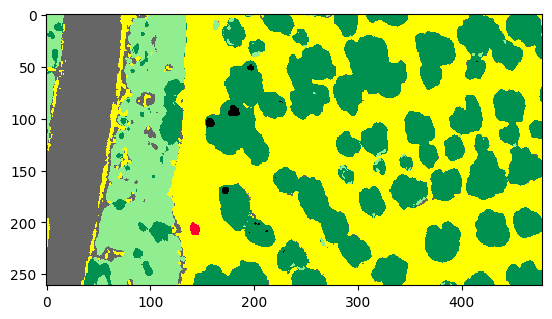

In [15]:
# Cargamos la máscara
mascara_source = rio.open(mascara_dir)
mascara_imagen = mascara_source.read()[0]
# Aplicamos la paleta de colores a la máscara
for x in range(0, len(colores_df)):
	lc_dict = colores_df.loc[x]
	mascara_imagen[mascara_imagen == lc_dict['values']] = lc_dict['values_normalize']
# Representamos la máscara
plt.imshow(mascara_imagen, cmap=cmap, interpolation='nearest', vmin=0, vmax=6)
#plt.legend(**legend)

In [20]:
#Observamos los valores unicos de la máscara
uniques = np.unique(mascara_imagen)
uniques

array([0, 1, 2, 3, 4, 6], dtype=uint8)

BoundingBox(left=0.0, bottom=261.0, right=478.0, top=0.0)


c:\Users\Usuari\AppData\Local\Programs\Python\Python311\Lib\site-packages\rasterio\__init__.py:368: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


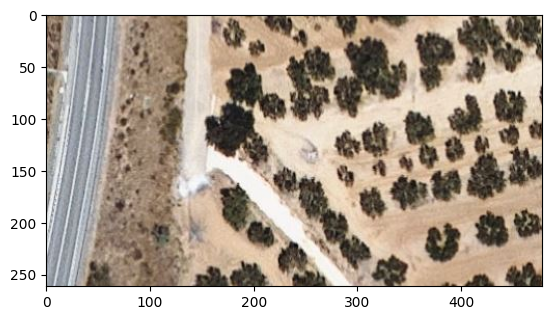

<Axes: >

In [21]:
# Visualizamos la imagen original
imagen = rio.open(imagen_dir)
print(imagen.bounds)
landsat_image = imagen.read() / 10000
show(imagen)

In [24]:
# Seleccionamos las dimensiones de la imagen parche
image_width = 128 #128 o 256 dependiendo de la elección del parche para la red
# Cuantificamos el número de parches por clase
num_parches = 30
plt.figure(figsize=(4 * num_parches, 4 * len(uniques)))
# Coordenadas
coords_dict = {}

#Loop para generar los parches y que no se solapen ni se salgan de la imagen
for x in range(0, len(uniques)):
	colores = uniques[x]
	coords = np.argwhere(mascara_imagen == colores)
	coords_filter = []
	for c in coords:
		cond1 = (c[0] - (image_width / 2)) >= 0
		cond2 = (c[1] - (image_width / 2)) >= 0
		cond3 = (c[0] + (image_width / 2)) <= mascara_imagen.shape[0]
		cond4 = (c[1] + (image_width / 2)) <= mascara_imagen.shape[1]

		if (cond1 & cond2 & cond3 & cond4):
			coords_filter.append(c)

	coords_dict[colores] = []

	if (len(coords_filter) > 0):
		seq = np.arange(len(coords_filter) - 1)
		sample = np.random.choice(seq, size=num_parches)
		sample_coord = list(map(lambda x: coords_filter[x], sample))

		for y in range(0, len(sample_coord)):
			coord = sample_coord[y]
			max_y = int(coord[0] + (image_width / 2))
			min_y = int(coord[0] - (image_width / 2))
			max_x = int(coord[1] + (image_width / 2))
			min_x = int(coord[1] - (image_width / 2))
			coords_dict[colores].append([
				min_y,
				max_y,
				min_x,
				max_x
			])

<Figure size 12000x2400 with 0 Axes>

Normalized bands
0.0 - 1.0 mean: 0.6251716390661405
0.0 - 1.0 mean: 0.5642556370084866
0.0 - 1.0 mean: 0.5058479333636979
(261, 478, 3)


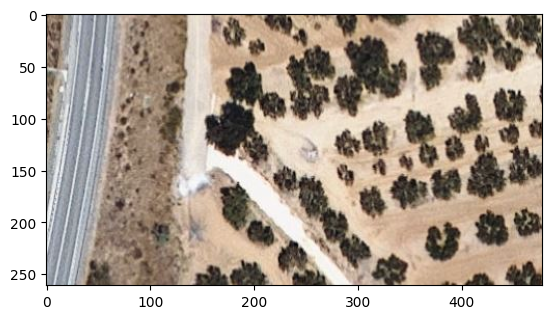

In [25]:
#Aplicamos el ajuste al tipo de datos satelitales a cada banda
imagen.read()
red = imagen.read(1)/10000
green = imagen.read(2)/10000
blue = imagen.read(3)/10000

#Aplicamos la normalización a cada banda
def normalize(array):
    array_min, array_max = array.min(), array.max()
    return ((array - array_min)/(array_max - array_min))

redn = normalize(red)
greenn = normalize(green)
bluen = normalize(blue)

print("Normalized bands")
print(redn.min(), '-', redn.max(), 'mean:', redn.mean())
print(greenn.min(), '-', greenn.max(), 'mean:', greenn.mean())
print(bluen.min(), '-', bluen.max(), 'mean:', bluen.mean())

rgb = np.dstack((redn, greenn, bluen))
print(rgb.shape)
plt.imshow(rgb)

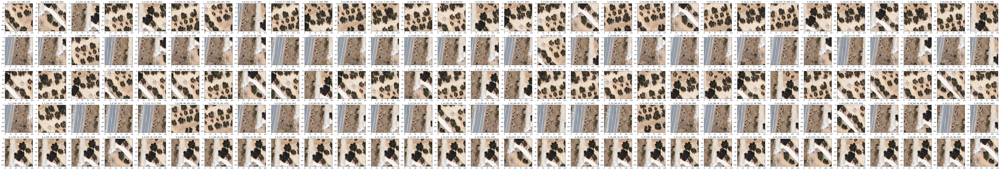

In [26]:
plt.figure(figsize=(4 * num_parches, 4 * len(uniques)))
for x in range(0, len(uniques)):
	colores = uniques[x]
	coords_list = coords_dict[colores]

	for y in range(0, len(coords_list)):
		min_y, max_y, min_x, max_x = coords_list[y]
		image_coord = rgb[min_y:max_y, min_x:max_x]
		image_coord_t = np.transpose(image_coord, (2, 0, 1))
		id = f'{colores}_{y + 1}'
		window = rio.windows.Window.from_slices((min_y, max_y), (min_x, max_x))
		transform = imagen.window_transform(window)

		# Guardamos los parches de la imagen original con todos los metadatos 
		output = rio.open(
			f'C:\\Users\\Usuari\\Documents\\TFM_Codigos\\PNOA_Preprocess\\data\\images\\{id}.tif', 
			'w',
			'COG',
			count=image_coord_t.shape[0],
			width=image_coord_t.shape[2],
			height=image_coord_t.shape[1],
			dtype='float32',
			compress='lzw',
			resampling=Resampling.nearest,
			transform=transform,
			crs= imagen.crs
		)
		output.write(image_coord_t)
		output.close()

		plt.subplot(len(uniques), num_parches, x * (num_parches) + y + 1)
		plt.imshow(image_coord)
		plt.title(f'{colores}_{y + 1}_[{min_y}, {min_y}, {min_x}, {max_x}]')

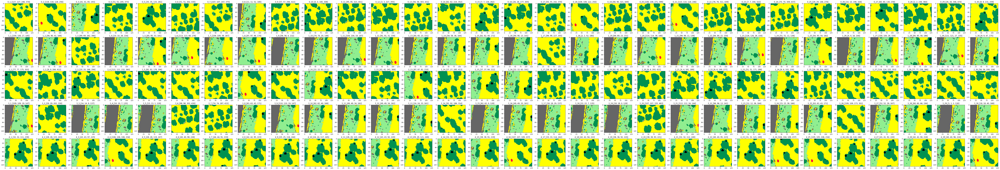

In [27]:
#Generamos las máscaras de validación para que coincidan con los parches de la imagen original
plt.figure(figsize=(4 * num_parches, 4 * len(uniques)))
for x in range(0, len(uniques)):
	colores = uniques[x]
	coords_list = coords_dict[colores]
	for y in range(0, len(coords_list)):
		
		min_y, max_y, min_x, max_x = coords_list[y]
		mascara_coord = mascara_imagen[min_y:max_y, min_x:max_x]
		id = f'{colores}_{y + 1}'
		window = rio.windows.Window.from_slices((min_y, max_y), (min_x, max_x))
		transform = imagen.window_transform(window)

		output = rio.open(
			f'C:\\Users\\Usuari\\Documents\\TFM_Codigos\\PNOA_Preprocess\\data\\lcs\\{id}.tif',
			'w',
			'COG',
			count=1,
			width=mascara_coord.shape[1],
			height=mascara_coord.shape[0],
			dtype='uint8',
			compress='lzw',
			resampling=Resampling.nearest,
			transform=transform,
			crs= imagen.crs
		)
		output.write(mascara_coord, 1)
		output.write_colormap(1, dict_palette)
		output.close()

		plt.subplot(len(uniques), num_parches, x * num_parches + y + 1)
		plt.imshow(mascara_coord, cmap=cmap, interpolation='nearest', vmin=0, vmax=6)
		plt.title(f'{colores}_{y + 1}_[{min_y}, {min_y}, {min_x}, {max_x}]')

In [28]:
#Augmentamos los parches de la imagen original con rotaciones para expandir el dataset
def augment(array, list):
    augmented = []
    flip = np.flip(array, 1)
    for arr in [array, flip]:
        for rot in [1, 2, 3]:
            rotated = np.rot90(arr, rot)
            list.append(rotated)
            augmented.append(rotated)
    return augmented

In [30]:
uniques

array([0, 1, 2, 3, 4, 6], dtype=uint8)

MODIFICAR LA CARPETA Y/O NOMBRE DE GUARDADO Creación de los Data-Arrays para el entrenamiento


In [ ]:
mascara_uniques = os.listdir('C:\\Users\\Usuari\\Documents\\TFM_Codigos\\PNOA_Preprocess\\data\\images\\')
mascara_uniques = list(map(lambda x: int(x.split('_')[0]), mascara_uniques))
mascara_uniques = np.unique(mascara_uniques)
mascara_uniques.sort()
mascara_uniques

index_train = int(8 / 10 * num_parches)

plt.figure(figsize=(4 * num_parches, 4 * len(mascara_uniques)))

images_train_dir = r'C:\Users\Usuari\Documents\TFM_Codigos\DATASET\images_train\images_train_41'
images_test_dir = r'C:\Users\Usuari\Documents\TFM_Codigos\DATASET\images_test\images_test_41'

#Creación del directorio si no existen
os.makedirs(images_train_dir, exist_ok=True)
os.makedirs(images_test_dir, exist_ok=True)

images_train = []
images_test = []

for x in range(0, len(mascara_uniques)):
	colores = mascara_uniques[x]
	images_list = os.listdir('C:\\Users\\Usuari\\Documents\\TFM_Codigos\\PNOA_Preprocess\\data\\images\\')
	images_list = list(filter(lambda x: int(x.split('_')[0]) == colores, images_list))
	#print(images_list)
	for y in range(0, len(images_list)):
		dir = images_list[y]
		name = dir.split('.')[0]
		image_dir = f'C:\\Users\\Usuari\\Documents\\TFM_Codigos\\PNOA_Preprocess\\data\\images\\{dir}'
		source = rio.open(image_dir)
		image = source.read()
		
		transposed = np.transpose(source.read(), (1, 2, 0))

		if y < index_train:
			augmented_images = augment(transposed, images_train)
			save_dir = images_train_dir
		else:
			augmented_images = augment(transposed, images_test)
			save_dir = images_test_dir

		for i, augmented_image in enumerate(augmented_images):
			save_path = os.path.join(save_dir, f'{name}_augmented_{i}.tif')
			with rio.open(
				save_path,
				'w',
				driver='COG',
				count=3,  # Cambiar a 3 para RGB
				width=augmented_image.shape[1],
				height=augmented_image.shape[0],
				dtype='uint8',
				compress='lzw',
				resampling=Resampling.nearest,
				transform=source.transform,
				crs=source.crs,
			) as dst:
				# Escribir los 3 canales (RGB)
				dst.write(augmented_image[:, :, 0], 1)  # Canal Rojo
				dst.write(augmented_image[:, :, 1], 2)  # Canal Verde
				dst.write(augmented_image[:, :, 2], 3)  # Canal Azul
		
		plt.subplot(len(mascara_uniques), num_parches, x * num_parches + y + 1)
		plt.imshow(np.transpose(image, (1, 2, 0)))
		plt.title(f'{name}')

		source.close()

# Conversión a numpy array
images_train = np.stack(images_train)
images_test = np.stack(images_test)
# Guardamos los arrays en formato .npy Decidir el nombre del archivo! 
np.save("images_train_41.npy", images_train)  
np.save("images_test_41.npy", images_test)

In [ ]:
# Configuración para guardar máscaras
train_dir = r'C:\Users\Usuari\Documents\TFM_Codigos\DATASET\\mascaras_train\\mascaras_train_40'
test_dir = r'C:\Users\Usuari\Documents\TFM_Codigos\DATASET\\mascaras_test\\mascaras_test_40'

# Crear directorios si no existen
os.makedirs(train_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)

plt.figure(figsize=(4 * num_parches, 4 * len(mascara_uniques)))

mascaras_train = []
mascaras_test = []

for x in range(0, len(mascara_uniques)):
    lc = mascara_uniques[x]
    images_list = os.listdir('C:\\Users\\Usuari\\Documents\\TFM_Codigos\\PNOA_Preprocess\\data\\lcs\\')
    images_list = list(filter(lambda img: int(img.split('_')[0]) == lc, images_list))

    for y in range(0, len(images_list)):
        dir = images_list[y]
        name = dir.split('.')[0]
        image_dir = f'C:\\Users\\Usuari\\Documents\\TFM_Codigos\\PNOA_Preprocess\\data\\lcs\\{dir}'
        source = rio.open(image_dir)
        image = source.read()

        # Transponer la imagen
        transposed = np.transpose(image, (1, 2, 0))

        # Aplicar augmentación y determinar la lista objetivo
        if y < index_train:
            augmented_images = augment(transposed, mascaras_train)
            save_dir = train_dir
        else:
            augmented_images = augment(transposed, mascaras_test)
            save_dir = test_dir

        # Guardar las imágenes augmentadas
        for i, augmented_image in enumerate(augmented_images):
            save_path = os.path.join(save_dir, f'{name}_augmented_{i}.tif')
            with rio.open(
                save_path,
                'w',
                driver='COG',
                count=1,
                width=augmented_image.shape[1],
                height=augmented_image.shape[0],
                dtype='uint8',
                compress='lzw',
                resampling=Resampling.nearest,
                transform=source.transform,
                crs=source.crs,
            ) as dst:
                # Escribir el primer canal (asumiendo escala de grises)
                dst.write(augmented_image[:, :, 0], 1)

        # Graficar la imagen original (sin augmentación)
        plt.subplot(len(mascara_uniques), num_parches, x * num_parches + y + 1)
        plt.imshow(image[0], cmap=cmap, interpolation='nearest', vmin=0, vmax=6)
        plt.title(f'{name}')

        source.close()

# Convertir las listas en arrays para entrenamiento y prueba
mascaras_train = np.stack(mascaras_train)
mascaras_test = np.stack(mascaras_test)

np.save("mascaras_train_41.npy", mascaras_train)
np.save("mascaras_test_41", mascaras_test)